# Predict the Credit_Mix category for a customer based on their financial data, and provide actionable insights to improve credit health.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import accuracy_score, classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
import warnings as wr
wr.filterwarnings('ignore')

In [2]:
url = 'https://raw.githubusercontent.com/rashakil-ds/Public-Datasets/refs/heads/main/Bank%20Data.csv'
df = pd.read_csv(url)
df.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance
0,0x160a,CUS_0xd40,September,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,2022.0,Good,809.98,35.030402,22 Years and 9 Months,No,49.574949,236.64268203272135,Low_spent_Small_value_payments,186.26670208571772
1,0x160b,CUS_0xd40,October,Aaron Maashoh,24,821-00-0265,Scientist,19114.12,1824.843333,3,...,4.0,Good,809.98,33.053114,22 Years and 10 Months,No,49.574949,21.465380264657146,High_spent_Medium_value_payments,361.44400385378196
2,0x160c,CUS_0xd40,November,Aaron Maashoh,24,821-00-0265,Scientist,19114.12,1824.843333,3,...,4.0,Good,809.98,33.811894,NaN,No,49.574949,148.23393788500925,Low_spent_Medium_value_payments,264.67544623342997
3,0x160d,CUS_0xd40,December,Aaron Maashoh,24_,821-00-0265,Scientist,19114.12,NaN,3,...,4.0,Good,809.98,32.430559,23 Years and 0 Months,No,49.574949,39.08251089460281,High_spent_Medium_value_payments,343.82687322383634
4,0x1616,CUS_0x21b1,September,Rick Rothackerj,28,004-07-5839,_______,34847.84,3037.986667,2,...,5.0,Good,605.03,25.926822,27 Years and 3 Months,No,18.816215,39.684018417945296,High_spent_Large_value_payments,485.2984336755923


In [3]:
df.columns

Index(['ID', 'Customer_ID', 'Month', 'Name', 'Age', 'SSN', 'Occupation',
       'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan', 'Type_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt',
       'Credit_Utilization_Ratio', 'Credit_History_Age',
       'Payment_of_Min_Amount', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Payment_Behaviour', 'Monthly_Balance'],
      dtype='object')

In [4]:
df1 = df.copy()
df2 = df.copy()
df3 = df.copy()

In [5]:
df1.dtypes  #To check the data types (before conversion to numerical dtypes for ml analysis)

ID                           object
Customer_ID                  object
Month                        object
Name                         object
Age                          object
SSN                          object
Occupation                   object
Annual_Income                object
Monthly_Inhand_Salary       float64
Num_Bank_Accounts             int64
Num_Credit_Card               int64
Interest_Rate                 int64
Num_of_Loan                  object
Type_of_Loan                 object
Delay_from_due_date           int64
Num_of_Delayed_Payment       object
Changed_Credit_Limit         object
Num_Credit_Inquiries        float64
Credit_Mix                   object
Outstanding_Debt             object
Credit_Utilization_Ratio    float64
Credit_History_Age           object
Payment_of_Min_Amount        object
Total_EMI_per_month         float64
Amount_invested_monthly      object
Payment_Behaviour            object
Monthly_Balance              object
dtype: object

# 1. Data Preprocessing
- Handle missing and invalid values in the dataset.
- Encode categorical variables appropriately.
- Scale and normalize numeric features for uniformity.
- Detect and address outliers to improve model stability.

### Handling of missing and null values

#### Preprocessing of target value data types for analysis 

In [6]:
# As "_" is in Target column
print("Before fixing '_':")
print(df['Credit_Mix'].value_counts(dropna=False))

# Replace "-" with NaN, then with 'unknown'
df['Credit_Mix'] = df['Credit_Mix'].replace('_', np.nan)
df['Credit_Mix'] = df['Credit_Mix'].fillna('unknown')

print("\nAfter fixing '_':")
print(df['Credit_Mix'].value_counts())

Before fixing '_':
Credit_Mix
Standard    18379
Good        12260
_            9805
Bad          9556
Name: count, dtype: int64

After fixing '_':
Credit_Mix
Standard    18379
Good        12260
unknown      9805
Bad          9556
Name: count, dtype: int64


In [7]:
# First, check how many rows contain "unknown" in Credit_Mix column
unknown_count = df['Credit_Mix'].value_counts().get('unknown', 0)
print(f"Number of rows with 'unknown' in Credit_Mix: {unknown_count}")

Number of rows with 'unknown' in Credit_Mix: 9805


In [8]:
# Drop rows where Credit_Mix is "unknown"
df_cleaned = df[df['Credit_Mix'] != 'unknown'].copy()
print(f"Original shape: {df.shape}")
print(f"Cleaned shape: {df_cleaned.shape}")

Original shape: (50000, 27)
Cleaned shape: (40195, 27)


In [9]:
# As the target Credit_Mix column value is object type and ordinal therefore encoding is necessary before ml.
from sklearn.preprocessing import OrdinalEncoder

encoder = OrdinalEncoder(categories=[['Bad', 'Standard', 'Good' ]])

y_encoded = encoder.fit_transform(df_cleaned[['Credit_Mix']])

In [10]:
y_encoded.shape

(40195, 1)

In [11]:
# Convert to 1D array first, then to Series
y_flat = y_encoded.flatten()  # or y_encoded.ravel()
value_counts = pd.Series(y_flat).value_counts()
value_counts

1.0    18379
2.0    12260
0.0     9556
Name: count, dtype: int64

In [12]:
df_cleaned.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance
0,0x160a,CUS_0xd40,September,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,2022.0,Good,809.98,35.030402,22 Years and 9 Months,No,49.574949,236.64268203272135,Low_spent_Small_value_payments,186.26670208571772
1,0x160b,CUS_0xd40,October,Aaron Maashoh,24,821-00-0265,Scientist,19114.12,1824.843333,3,...,4.0,Good,809.98,33.053114,22 Years and 10 Months,No,49.574949,21.465380264657146,High_spent_Medium_value_payments,361.44400385378196
2,0x160c,CUS_0xd40,November,Aaron Maashoh,24,821-00-0265,Scientist,19114.12,1824.843333,3,...,4.0,Good,809.98,33.811894,NaN,No,49.574949,148.23393788500925,Low_spent_Medium_value_payments,264.67544623342997
3,0x160d,CUS_0xd40,December,Aaron Maashoh,24_,821-00-0265,Scientist,19114.12,NaN,3,...,4.0,Good,809.98,32.430559,23 Years and 0 Months,No,49.574949,39.08251089460281,High_spent_Medium_value_payments,343.82687322383634
4,0x1616,CUS_0x21b1,September,Rick Rothackerj,28,004-07-5839,_______,34847.84,3037.986667,2,...,5.0,Good,605.03,25.926822,27 Years and 3 Months,No,18.816215,39.684018417945296,High_spent_Large_value_payments,485.2984336755923


#### Seperation of target varibale (y) from other features (x) in the data set

In [13]:
x = df_cleaned.drop(columns=['Credit_Mix','Customer_ID','Name','ID']) # act same as "X = df.drop('column name', axis=1)"
y = df_cleaned['Credit_Mix']  # Here, y is the target variable column's value

In [14]:
x.shape

(40195, 23)

In [15]:
y.value_counts()

Credit_Mix
Standard    18379
Good        12260
Bad          9556
Name: count, dtype: int64

In [16]:
print(y.dtypes) #Checking the data types of the target variables

object


#### Preprocessing of features data types for analysis 

In [17]:
df_cleaned[1:3]

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance
1,0x160b,CUS_0xd40,October,Aaron Maashoh,24,821-00-0265,Scientist,19114.12,1824.843333,3,...,4.0,Good,809.98,33.053114,22 Years and 10 Months,No,49.574949,21.465380264657146,High_spent_Medium_value_payments,361.44400385378196
2,0x160c,CUS_0xd40,November,Aaron Maashoh,24,821-00-0265,Scientist,19114.12,1824.843333,3,...,4.0,Good,809.98,33.811894,NaN,No,49.574949,148.23393788500925,Low_spent_Medium_value_payments,264.67544623342997


In [18]:
num_col = [
    'Monthly_Inhand_Salary',      # Already float
    'Num_Bank_Accounts',          # Already int
    'Num_Credit_Card',            # Already int
    'Interest_Rate',              # Already int
    'Delay_from_due_date',        # Already int
    'Num_Credit_Inquiries',       # Already float
    'Credit_Utilization_Ratio',   # Already float
    'Total_EMI_per_month'         # Already float
]

convert_num_col = [
    'Age',                       # Object but should be int
    'Annual_Income',             # Object but should be float
    'Num_of_Loan',               # Object but should be int
    'Num_of_Delayed_Payment',    # Object but should be int
    'Outstanding_Debt',          # Object but should be float
    'Amount_invested_monthly',   # Object but should be float
    'Monthly_Balance',            # Object but should be float
    'Changed_Credit_Limit',
]

categorical_col = [
    'Payment_Behaviour',         # Has order: Bad < Average < Good
    'Credit_History_Age',        # Has order: 1yr < 5yrs < 10yrs
    'Month',                     # 12 categories, no order
    'Occupation',                # Job types, no order
    'Type_of_Loan',              # Loan types, no order
    'Payment_of_Min_Amount'      # Yes/No type
    'SSN'
]

print(" Categories for encoding!")

 Categories for encoding!


In [19]:
def clean_numeric_column(col):      # def means we're creating a new function (like a recipe) clean_numeric_column is the function's name (col) means the function expects one input (we'll call it col)
    col = col.astype(str)           #converts everything in col to text/string format
    col = col.str.replace(',', '', regex=False)   # .str.replace() looks for something and replaces it;',' is what we're looking for (commas);'' is what we replace with (empty/nothing); regex=False means "treat commas literally, not as special code"
    col = col.str.replace(' ', '', regex=False)
    return pd.to_numeric(col, errors='coerce') # pd.to_numeric() tries to convert text to actual numbers; errors='coerce' means: "if you can't convert something to a number, just make it NaN (Not a Number) instead of crashing"; return gives the cleaned result back to whoever called the function

for col in convert_num_col:
    x[col] = clean_numeric_column(x[col])

In [20]:
# To see the data types of the features 
print(x.dtypes) # after conversion of data types

Month                        object
Age                         float64
SSN                          object
Occupation                   object
Annual_Income               float64
Monthly_Inhand_Salary       float64
Num_Bank_Accounts             int64
Num_Credit_Card               int64
Interest_Rate                 int64
Num_of_Loan                 float64
Type_of_Loan                 object
Delay_from_due_date           int64
Num_of_Delayed_Payment      float64
Changed_Credit_Limit        float64
Num_Credit_Inquiries        float64
Outstanding_Debt            float64
Credit_Utilization_Ratio    float64
Credit_History_Age           object
Payment_of_Min_Amount        object
Total_EMI_per_month         float64
Amount_invested_monthly     float64
Payment_Behaviour            object
Monthly_Balance             float64
dtype: object


In [21]:
#drop duplicates rows
# x.drop_duplicates(inplace=True)

### Splitting of Data to Train and Test set

In [22]:
from sklearn.model_selection import train_test_split

In [23]:
x_train, x_test, y_train, y_test = train_test_split(x, y_encoded, test_size=0.3, random_state=42)

In [24]:
x_train.shape

(28136, 23)

In [25]:
x_train[1:3]

,Month,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,...,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance
14539,December,27.0,777-03-1147,Manager,18327.97,1276.330833,10,5,34,3.0,...,13.63,15.0,2358.32,25.226449,18 Years and 10 Months,Yes,23.823111,18.636148,High_spent_Large_value_payments,325.173825
6741,October,35.0,584-75-6404,Mechanic,34297.90,2801.158333,9,8,16,8.0,...,21.50,15.0,4469.48,27.072432,3 Years and 4 Months,Yes,175.806488,94.832790,High_spent_Small_value_payments,269.476555


In [26]:
x_test.shape

(12059, 23)

In [27]:
# y_train.value_counts()

In [28]:
y_train_1d=np.array(y_train) # converting 1d y_train data into the 2d data frame for counting and visualization
y_train_1d

array([[0.],
       [1.],
       [0.],
       ...,
       [2.],
       [2.],
       [2.]])

In [29]:
y_train_2d = pd.DataFrame(y_train_1d.reshape(-1, 1), columns=['Credit_Mix'])
y_train_2d.head()

,Credit_Mix
0,0.0
1,1.0
2,0.0
3,0.0
4,1.0


In [30]:
xtesting, xvalidation, ytesting, yvalidation = train_test_split(x_test, y_test, train_size=.50, random_state=85) # 15% test , 15% val and rest 70% is train

In [31]:
xtesting.shape

(6029, 23)

In [32]:
xvalidation.shape

(6030, 23)

## Visualize the distribution of the target variable (Credit_Mix)

In [33]:
import seaborn as sns 
import matplotlib.pyplot as plt

In [34]:
target_count = y_train_2d['Credit_Mix'].value_counts() # To count the whole data sets target category we can replace the "y_train_2d" with "df"
print(target_count)

Credit_Mix
1.0    12908
2.0     8524
0.0     6704
Name: count, dtype: int64


In [35]:
target_counts = {
    'Standard': 12908,
    'Good': 8524,
     'Bad': 6704
}
print("Target Distribution:")
for category, count in target_counts.items():
    total = sum(target_counts.values())  # "target_counts.values()" counts values inside the predefined dictionary 
    percentage = count / total * 100
    print(f"  {category}: {count:,} ({percentage:.1f}%)")

# Total
total = sum(target_counts.values())
#print(f"\nTotal samples: {total:,}")
#print(f"' _ ' category: {target_counts['unknown']:,} ({target_counts['unknown']/total*100:.1f}%)")

Target Distribution:
  Standard: 12,908 (45.9%)
  Good: 8,524 (30.3%)
  Bad: 6,704 (23.8%)


<Axes: xlabel='Credit_Mix', ylabel='count'>

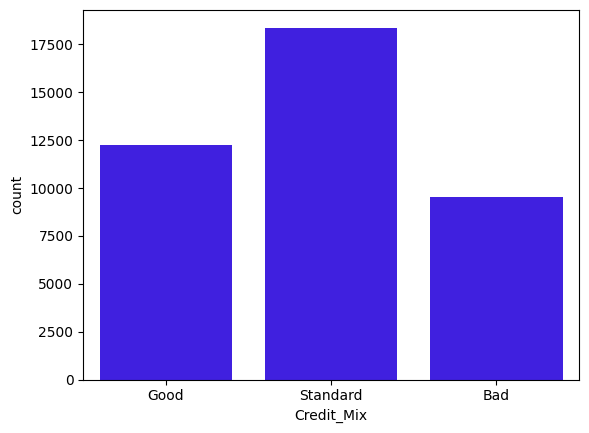

In [36]:
sns.countplot(data=df_cleaned, x=df_cleaned['Credit_Mix'], color='#2B00FF') #to plot the count of categorical value

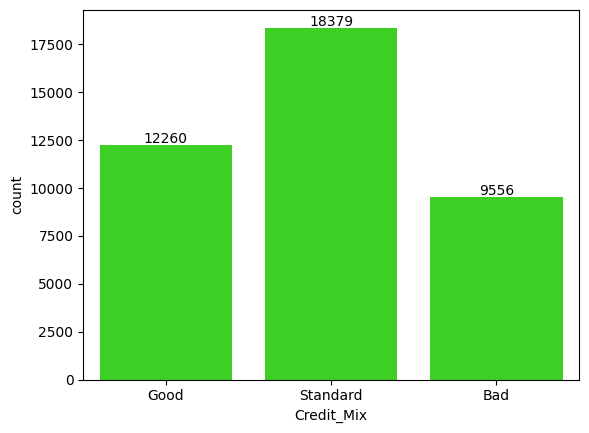

In [38]:
sns.countplot(data=df_cleaned, x=df_cleaned['Credit_Mix'], color='#29ec06') #29ec06 #2B00FF

for p in plt.gca().patches:                     #gca=get current axis #patches are the bars
    plt.text(p.get_x() + p.get_width() / 2,     # x-coordinate
    p.get_height() + 80,                        # y-coordinate
    int(p.get_height()),                        # The count value
    ha='center')                                # Center alignment  #ha=horizontal axis

plt.show()

## Comments on imbalanced target variable 
Abobe analysis showing the imbalanced values in the target variable column. 
In addition the undefined category is about 20% of the total value and therefore it is not wise to remove from data analysis. 
Therefore it is necessary to balance the data before training the model.

### Imbalance data handling

In [39]:
#!pip install imblearn (to install the imblearn)

In [40]:
from imblearn.combine import SMOTETomek
from collections import Counter
from sklearn.datasets import make_classification

In [41]:
smt = SMOTETomek(random_state=42) 

In [42]:
print(type(y_train))  # Checking if it's numpy.ndarray or pandas.Series
print(y_train.shape)  # Check shape
print(type(y_train_2d)) 
print(y_train_2d.shape)

<class 'numpy.ndarray'>
(28136, 1)
<class 'pandas.core.frame.DataFrame'>
(28136, 1)


In [43]:
y_train_2d.value_counts() # before sampling 

Credit_Mix
1.0           12908
2.0            8524
0.0            6704
Name: count, dtype: int64

In [44]:
x[1:3]

,Month,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,...,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance
1,October,24.0,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4.0,...,13.27,4.0,809.98,33.053114,22 Years and 10 Months,No,49.574949,21.465380,High_spent_Medium_value_payments,361.444004
2,November,24.0,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4.0,...,12.27,4.0,809.98,33.811894,NaN,No,49.574949,148.233938,Low_spent_Medium_value_payments,264.675446


In [45]:
numerical_cols = x_train.select_dtypes(include=['int64', 'float64', 'int32', 'float32']).columns.tolist()
categorical_cols = x_train.select_dtypes(include=['object', 'category', 'bool']).columns.tolist()

In [46]:
numerical_cols

['Age',
 'Annual_Income',
 'Monthly_Inhand_Salary',
 'Num_Bank_Accounts',
 'Num_Credit_Card',
 'Interest_Rate',
 'Num_of_Loan',
 'Delay_from_due_date',
 'Num_of_Delayed_Payment',
 'Changed_Credit_Limit',
 'Num_Credit_Inquiries',
 'Outstanding_Debt',
 'Credit_Utilization_Ratio',
 'Total_EMI_per_month',
 'Amount_invested_monthly',
 'Monthly_Balance']

In [47]:
categorical_cols

['Month',
 'SSN',
 'Occupation',
 'Type_of_Loan',
 'Credit_History_Age',
 'Payment_of_Min_Amount',
 'Payment_Behaviour']

In [48]:
x_train.shape

(28136, 23)

In [49]:
df_cleaned.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance
0,0x160a,CUS_0xd40,September,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,2022.0,Good,809.98,35.030402,22 Years and 9 Months,No,49.574949,236.64268203272135,Low_spent_Small_value_payments,186.26670208571772
1,0x160b,CUS_0xd40,October,Aaron Maashoh,24,821-00-0265,Scientist,19114.12,1824.843333,3,...,4.0,Good,809.98,33.053114,22 Years and 10 Months,No,49.574949,21.465380264657146,High_spent_Medium_value_payments,361.44400385378196
2,0x160c,CUS_0xd40,November,Aaron Maashoh,24,821-00-0265,Scientist,19114.12,1824.843333,3,...,4.0,Good,809.98,33.811894,NaN,No,49.574949,148.23393788500925,Low_spent_Medium_value_payments,264.67544623342997
3,0x160d,CUS_0xd40,December,Aaron Maashoh,24_,821-00-0265,Scientist,19114.12,NaN,3,...,4.0,Good,809.98,32.430559,23 Years and 0 Months,No,49.574949,39.08251089460281,High_spent_Medium_value_payments,343.82687322383634
4,0x1616,CUS_0x21b1,September,Rick Rothackerj,28,004-07-5839,_______,34847.84,3037.986667,2,...,5.0,Good,605.03,25.926822,27 Years and 3 Months,No,18.816215,39.684018417945296,High_spent_Large_value_payments,485.2984336755923


In [50]:
from sklearn.pipeline import Pipeline
from imblearn.pipeline import Pipeline as ImbPipeline

from sklearn.impute import SimpleImputer # impute the missing null value in the data set
from sklearn.impute import KNNImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

from sklearn.compose import ColumnTransformer 
from sklearn.preprocessing import StandardScaler, RobustScaler, OneHotEncoder
from sklearn.ensemble import RandomForestClassifier

In [51]:
# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')), # FIRST, IMPUTE MISSING VALUES
    ('scaler', RobustScaler())                # THEN, SCALE
])
# Preprocessing for categorical data
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')), # FIRST, IMPUTE MISSING VALUES
    ('onehot', OneHotEncoder(handle_unknown='ignore'))    # THEN, ENCODE
])
# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(transformers=[('num', numerical_transformer, numerical_cols), #Part 1:'num' (The Team's Name),Part2:numerical_transformer (The Team and Their Tools),Part3:numerical_cols (The Team's Assignment)
        ('cat', categorical_transformer, categorical_cols)])

In [52]:
imbalance_pipeline = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('resampler', SMOTETomek(random_state=42))
    ])

In [53]:
x_res,y_res = imbalance_pipeline.fit_resample(x_train, y_train)

In [54]:
# → .value_counts() works for panda series y
# After SMOTETomek, y_res becomes a NumPy array → .value_counts() no longer works. Converting back solves it.

In [55]:
y_res = pd.Series(y_res) 
y_res.value_counts()     # after applying SMOTETomek 

0.0    12830
2.0    12702
1.0    12636
Name: count, dtype: int64

# 2. Exploratory Data Analysis (EDA)
- Perform descriptive statistics to understand the data distribution.
- Visualize relationships between features and the target variable.
- Analyze correlations and identify trends or anomalies in the data.

In [191]:
import pandas_profiling
from pandas_profiling import ProfileReport
ProfileReport(df, title="Full EDA Report of Predicting Customer Credit Dataset")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 27/27 [00:04<00:00,  5.68it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Save as HTML (default)
eda_report.to_file("EDA_report_predicting_customer_credit.html")

ProfileReport(x_train, title="EDA Report of Predicting Customer Credit on Training Dataset")

eda_report_train=ProfileReport(x_train, title="EDA Report of Predicting Customer Credit on Training Dataset")

### Save as HTML (default)
eda_report_train.to_file("EDA Report of Predicting Customer Credit on Training Dataset.html")

# 3. Model Building
- Train multiple machine learning models using the preprocessed data.
- Evaluate the suitability of various models for the task.


## Logistic Regression Classifier Model

In [56]:
from sklearn.linear_model import LogisticRegression
import xgboost as xgb
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, RocCurveDisplay

In [57]:
from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.combine import SMOTETomek

#To use SMOTETomek inside a pipeline, we must use imblearn.pipeline.Pipeline (ImbPipeline) instead of sklearn.pipeline.Pipeline.
# Because ImbPipeline supports samplers, scikit-learn’s Pipeline does not.

In [58]:
lg_reg =  LogisticRegression()

In [59]:
# FINAL PIPELINE WITH SMOTETomek 
model_pipeline_lg_reg = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('resampler', SMOTETomek(random_state=42)),
    ('classifier', lg_reg)
])

In [60]:
model_pipeline_lg_reg

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   RobustScaler())]),
                                                  ['Age', 'Annual_Income',
                                                   'Monthly_Inhand_Salary',
                                                   'Num_Bank_Accounts',
                                                   'Num_Credit_Card',
                                                   'Interest_Rate',
                                                   'Num_of_Loan',
                                                   'Delay_from_due_date',
                                                   'Num_of_Delayed_Payment',
                                                   'Changed_Credit_Limit',
                                                   'Num_Credit_Inquiries'...
                                                   'Amount_invested_monthly',
                                                   'Monthly_Balance']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['Month', 'SSN', 'Occupation',
                                                   'Type_of_Loan',
                                                   'Credit_History_Age',
                                                   'Payment_of_Min_Amount',
                                                   'Payment_Behaviour'])])),
                ('resampler', SMOTETomek(random_state=42)),
                ('classifier', LogisticRegression())])

In [61]:
model_pipeline_lg_reg.fit(x_train,y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   RobustScaler())]),
                                                  ['Age', 'Annual_Income',
                                                   'Monthly_Inhand_Salary',
                                                   'Num_Bank_Accounts',
                                                   'Num_Credit_Card',
                                                   'Interest_Rate',
                                                   'Num_of_Loan',
                                                   'Delay_from_due_date',
                                                   'Num_of_Delayed_Payment',
                                                   'Changed_Credit_Limit',
                                                   'Num_Credit_Inquiries'...
                                                   'Amount_invested_monthly',
                                                   'Monthly_Balance']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['Month', 'SSN', 'Occupation',
                                                   'Type_of_Loan',
                                                   'Credit_History_Age',
                                                   'Payment_of_Min_Amount',
                                                   'Payment_Behaviour'])])),
                ('resampler', SMOTETomek(random_state=42)),
                ('classifier', LogisticRegression())])

In [62]:
# Make predictions (applies the same fitted scaler/encoder to X_test)
y_pred_lg = model_pipeline_lg_reg.predict(x_test)

# Evaluate the model
from sklearn.metrics import accuracy_score
print("Testing Accuracy for Logistic Regression:", accuracy_score(y_test, y_pred_lg))

Testing Accuracy for Logistic Regression: 0.8257732813666141


In [63]:
print("Training Accuracy Score:", accuracy_score(y_train, model_pipeline_lg_reg.predict(x_train))) #training accuracy

Training Accuracy Score: 0.8284048905317032


In [64]:
#If the target value is multiclass or more than 2 then we need to change the defalut average settings. 
# If the classes are balanced then we can use 'macro' and if the classes are imbalanced then we can use 'weighted' 

In [65]:
print(f'f1-score:{f1_score(y_test, y_pred_lg,average='macro')},\nprecision-score:{precision_score(y_test, y_pred_lg,average='macro')},\nrecall-score:{recall_score(y_test, y_pred_lg,average='macro')}')

f1-score:0.8314360119665473,
precision-score:0.8267773316636321,
recall-score:0.849459778219429


## Random Forest Classifier 

In [66]:
from sklearn.ensemble import RandomForestClassifier

In [67]:
rf_clf = RandomForestClassifier()

In [68]:
model_pipeline_rf_clf = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('resampler', SMOTETomek(random_state=42)),
    ('classifier', rf_clf)
])

In [69]:
model_pipeline_rf_clf.fit(x_train,y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   RobustScaler())]),
                                                  ['Age', 'Annual_Income',
                                                   'Monthly_Inhand_Salary',
                                                   'Num_Bank_Accounts',
                                                   'Num_Credit_Card',
                                                   'Interest_Rate',
                                                   'Num_of_Loan',
                                                   'Delay_from_due_date',
                                                   'Num_of_Delayed_Payment',
                                                   'Changed_Credit_Limit',
                                                   'Num_Credit_Inquiries'...
                                                   'Amount_invested_monthly',
                                                   'Monthly_Balance']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['Month', 'SSN', 'Occupation',
                                                   'Type_of_Loan',
                                                   'Credit_History_Age',
                                                   'Payment_of_Min_Amount',
                                                   'Payment_Behaviour'])])),
                ('resampler', SMOTETomek(random_state=42)),
                ('classifier', RandomForestClassifier())])

In [70]:
y_pred_rf = model_pipeline_rf_clf.predict(x_test)

# Evaluate the model
from sklearn.metrics import accuracy_score
AccuracyScore=accuracy_score(y_test, y_pred_rf)
print(f'"Testing Accuracy for Random Forest:", {AccuracyScore:.8f}')

"Testing Accuracy for Random Forest:", 0.94103989


In [71]:
print(f'f1-score:{f1_score(y_test, y_pred_rf,average='macro')},\nprecision-score:{precision_score(y_test, y_pred_rf,average='macro')},\nrecall-score:{recall_score(y_test, y_pred_rf,average='macro')}')

f1-score:0.9426678312086155,
precision-score:0.9369774019034637,
recall-score:0.9499257771428212


## KNN Classifier

In [72]:
from sklearn.neighbors import KNeighborsClassifier
import seaborn as sns 
import matplotlib.pyplot as plt 
import warnings
warnings.filterwarnings('ignore')

In [73]:
kn_cls=KNeighborsClassifier(n_neighbors=5)

In [74]:
model_pipeline_knn_cls = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('resampler', SMOTETomek(random_state=42)),
    ('classifier', kn_cls)
])

In [75]:
model_pipeline_knn_cls.fit(x_train,y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   RobustScaler())]),
                                                  ['Age', 'Annual_Income',
                                                   'Monthly_Inhand_Salary',
                                                   'Num_Bank_Accounts',
                                                   'Num_Credit_Card',
                                                   'Interest_Rate',
                                                   'Num_of_Loan',
                                                   'Delay_from_due_date',
                                                   'Num_of_Delayed_Payment',
                                                   'Changed_Credit_Limit',
                                                   'Num_Credit_Inquiries'...
                                                   'Amount_invested_monthly',
                                                   'Monthly_Balance']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['Month', 'SSN', 'Occupation',
                                                   'Type_of_Loan',
                                                   'Credit_History_Age',
                                                   'Payment_of_Min_Amount',
                                                   'Payment_Behaviour'])])),
                ('resampler', SMOTETomek(random_state=42)),
                ('classifier', KNeighborsClassifier())])

In [76]:
y_pred_knn = model_pipeline_knn_cls.predict(x_test)

# Evaluate the model
from sklearn.metrics import accuracy_score
print("Testing Accuracy:", accuracy_score(y_test, y_pred_knn))

Testing Accuracy: 0.8001492661083008


In [77]:
print(f'f1-score:{f1_score(y_test, y_pred_knn,average='macro')},\nprecision-score:{precision_score(y_test, y_pred_knn,average='macro')},\nrecall-score:{recall_score(y_test, y_pred_knn,average='macro')}')

f1-score:0.8040882604444696,
precision-score:0.8013870209981864,
recall-score:0.835250842016396


## XGBoost Classsifier

In [78]:
from xgboost import XGBClassifier

In [79]:
xgb_clf = XGBClassifier(eval_metric='logloss', random_state=42)

In [80]:
model_pipeline_xgb_clf= ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('resampler', SMOTETomek(random_state=42)),
    ('classifier', xgb_clf)
])

In [81]:
model_pipeline_xgb_clf.fit(x_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   RobustScaler())]),
                                                  ['Age', 'Annual_Income',
                                                   'Monthly_Inhand_Salary',
                                                   'Num_Bank_Accounts',
                                                   'Num_Credit_Card',
                                                   'Interest_Rate',
                                                   'Num_of_Loan',
                                                   'Delay_from_due_date',
                                                   'Num_of_Delayed_Payment',
                                                   'Changed_Credit_Limit',
                                                   'Num_Credit_Inquiries'...
                               feature_types=None, feature_weights=None,
                               gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=None, n_jobs=None,
                               num_parallel_tree=None, ...))])

In [82]:
y_pred_xgb = model_pipeline_xgb_clf.predict(x_test)

# Evaluate the model
print("Testing Accuracy for XGB:", accuracy_score(y_test, y_pred_xgb))

Testing Accuracy for XGB: 0.9497470768720457


In [83]:
print(f'f1-score:{f1_score(y_test, y_pred_xgb,average='macro')},\nprecision-score:{precision_score(y_test, y_pred_xgb,average='macro')},\nrecall-score:{recall_score(y_test, y_pred_xgb,average='macro')}')

f1-score:0.9514691755627833,
precision-score:0.9501056334043018,
recall-score:0.9528923023863588


## Decision Tree Classifier

In [84]:
from sklearn.tree import DecisionTreeClassifier
dt_clf = DecisionTreeClassifier()

In [85]:
model_pipeline_dt_clf = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('resampler', SMOTETomek(random_state=42)),
    ('classifier', dt_clf)
])

In [86]:
model_pipeline_dt_clf.fit(x_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   RobustScaler())]),
                                                  ['Age', 'Annual_Income',
                                                   'Monthly_Inhand_Salary',
                                                   'Num_Bank_Accounts',
                                                   'Num_Credit_Card',
                                                   'Interest_Rate',
                                                   'Num_of_Loan',
                                                   'Delay_from_due_date',
                                                   'Num_of_Delayed_Payment',
                                                   'Changed_Credit_Limit',
                                                   'Num_Credit_Inquiries'...
                                                   'Amount_invested_monthly',
                                                   'Monthly_Balance']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['Month', 'SSN', 'Occupation',
                                                   'Type_of_Loan',
                                                   'Credit_History_Age',
                                                   'Payment_of_Min_Amount',
                                                   'Payment_Behaviour'])])),
                ('resampler', SMOTETomek(random_state=42)),
                ('classifier', DecisionTreeClassifier())])

In [87]:
# Make predictions (applies the same fitted scaler/encoder to X_test)
y_pred_dt = model_pipeline_dt_clf.predict(x_test)

# Evaluate the model
from sklearn.metrics import accuracy_score
print("Testing Accuracy for Decision Tree:", accuracy_score(y_test, y_pred_dt))

Testing Accuracy for Decision Tree: 0.9515714404179451


In [88]:
f1_score(y_test, y_pred_dt, average='macro')

0.9527265295025966

In [89]:
print(f'f1-score:{f1_score(y_test, y_pred_dt,average='macro')},\nprecision-score:{precision_score(y_test, y_pred_dt,average='macro')},\nrecall-score:{recall_score(y_test, y_pred_dt,average='macro')}')

f1-score:0.9527265295025966,
precision-score:0.9509891869191568,
recall-score:0.9545837523066242


# 4. Model Evaluation
- Compute and plot evaluation metrics for all models, such as accuracy, precision, recall, F1-score, and AUC-ROC.
- Compare the performance of models across multiple metrics.

In [90]:
conf_matrix_lg = confusion_matrix(y_test, y_pred_lg) # y_test = original y, y_pred_lg=predicted y
conf_matrix_rf = confusion_matrix(y_test, y_pred_rf)
conf_matrix_xgb = confusion_matrix(y_test, y_pred_xgb)
conf_matrix_dt = confusion_matrix(y_test, y_pred_dt)
print('Comparison of Confusion Matrix for Classifier Models')
print(f'Logistic regression: \n{conf_matrix_lg}, \nRandom Forest: \n{conf_matrix_rf}')
print(f'XGBoost: \n{conf_matrix_xgb}, \nDecision Tree: \n{conf_matrix_dt}')

Comparison of Confusion Matrix for Classifier Models
Logistic regression: 
[[2557  291    4]
 [ 535 3878 1058]
 [   0  213 3523]], 
Random Forest: 
[[2796   56    0]
 [ 247 4944  280]
 [   0  128 3608]]
XGBoost: 
[[2763   89    0]
 [ 133 5138  200]
 [   0  184 3552]], 
Decision Tree: 
[[2745  107    0]
 [ 145 5130  196]
 [   0  136 3600]]


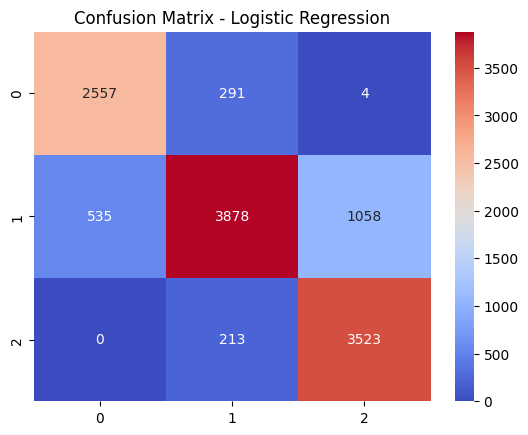

In [91]:
sns.heatmap(conf_matrix_lg, annot=True, fmt='d', cmap='coolwarm') # cmap='Purples'
plt.title('Confusion Matrix - Logistic Regression')
plt.show()

In [92]:
print("Logistic Regression Report:")
print(classification_report(y_test, y_pred_lg))
print("Random Forest Report:")
print(classification_report(y_test, y_pred_rf))

Logistic Regression Report:
              precision    recall  f1-score   support

         0.0       0.83      0.90      0.86      2852
         1.0       0.88      0.71      0.79      5471
         2.0       0.77      0.94      0.85      3736

    accuracy                           0.83     12059
   macro avg       0.83      0.85      0.83     12059
weighted avg       0.84      0.83      0.82     12059

Random Forest Report:
              precision    recall  f1-score   support

         0.0       0.92      0.98      0.95      2852
         1.0       0.96      0.90      0.93      5471
         2.0       0.93      0.97      0.95      3736

    accuracy                           0.94     12059
   macro avg       0.94      0.95      0.94     12059
weighted avg       0.94      0.94      0.94     12059



## Comparison of Models for performance evaluation

In [93]:
accuracy_scores = {
    "Logistic Regression": accuracy_score(y_test, y_pred_lg),
    "Random Forest" : accuracy_score(y_test, y_pred_rf),
    "KNN Classifier" : accuracy_score(y_test, y_pred_knn),
    "XGBoost": accuracy_score(y_test, y_pred_xgb),
    "Decision-Tree": accuracy_score(y_test, y_pred_dt)
}

In [94]:
Training_accuracy_scores = {
    "Logistic Regression": accuracy_score(y_train, model_pipeline_lg_reg.predict(x_train)),
    "Random Forest" : accuracy_score(y_train, model_pipeline_rf_clf.predict(x_train)),
    "KNN Classifier" : accuracy_score(y_train, model_pipeline_knn_cls.predict(x_train)),
    "XGBoost": accuracy_score(y_train, model_pipeline_xgb_clf.predict(x_train)),
    "Decision-Tree": accuracy_score(y_train, model_pipeline_dt_clf.predict(x_train))
    }

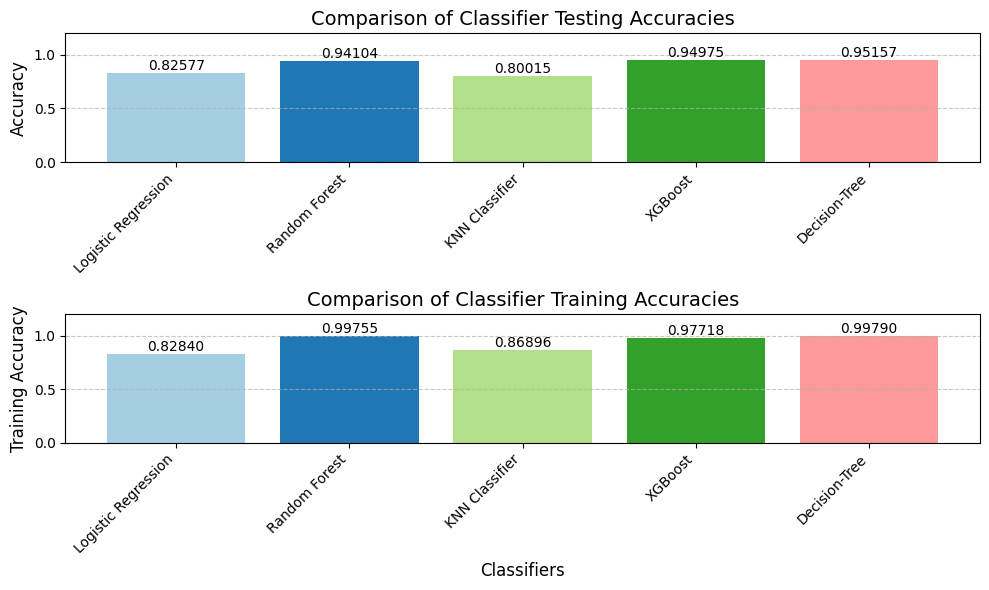

In [95]:
plt.figure(figsize=(10,6))

plt.subplot(2,1,1) # Creates a grid of plots (2 row × 1 columns)

colors = plt.cm.Paired(np.arange(len(accuracy_scores)))  # Used a colormap for different bar colors
bars = plt.bar(accuracy_scores.keys(), accuracy_scores.values(), color=colors)

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.5f}', ha='center', va='bottom', fontsize=10)

#plt.xlabel('Classifiers', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.title('Comparison of Classifier Testing Accuracies', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.ylim(0, 1.2)  # Extend limit slightly above 1 for better visibility of text
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.subplot(2,1,2)

colors = plt.cm.Paired(np.arange(len(Training_accuracy_scores)))  # Used a colormap for different bar colors
bars = plt.bar(Training_accuracy_scores.keys(), Training_accuracy_scores.values(), color=colors)

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.5f}', ha='center', va='bottom', fontsize=10)

plt.xlabel('Classifiers', fontsize=12)
plt.ylabel('Training Accuracy', fontsize=12)
plt.title('Comparison of Classifier Training Accuracies', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.ylim(0, 1.2)  # Extend limit slightly above 1 for better visibility of text
plt.grid(axis='y', linestyle='--', alpha=0.7)


# Show the plot
plt.tight_layout()
plt.show()

In [96]:
f1_scores = {
    "Logistic Regression": f1_score(y_test, y_pred_lg, average='macro'),
    "Random Forest" : f1_score(y_test, y_pred_rf, average='macro'),
    "KNN Classifier" : f1_score(y_test, y_pred_knn, average='macro'),
    "XGBoost": f1_score(y_test, y_pred_xgb, average='macro'),
    "Decision-Tree": f1_score(y_test, y_pred_dt, average='macro')
}

recall_scores = {
    "Logistic Regression": recall_score(y_test, y_pred_lg, average='macro'),
    "Random Forest" : recall_score(y_test, y_pred_rf, average='macro'),
    "KNN Classifier" : recall_score(y_test, y_pred_knn, average='macro'),
    "XGBoost": recall_score(y_test, y_pred_xgb, average='macro'),
    "Decision-Tree": recall_score(y_test, y_pred_dt, average='macro')
}

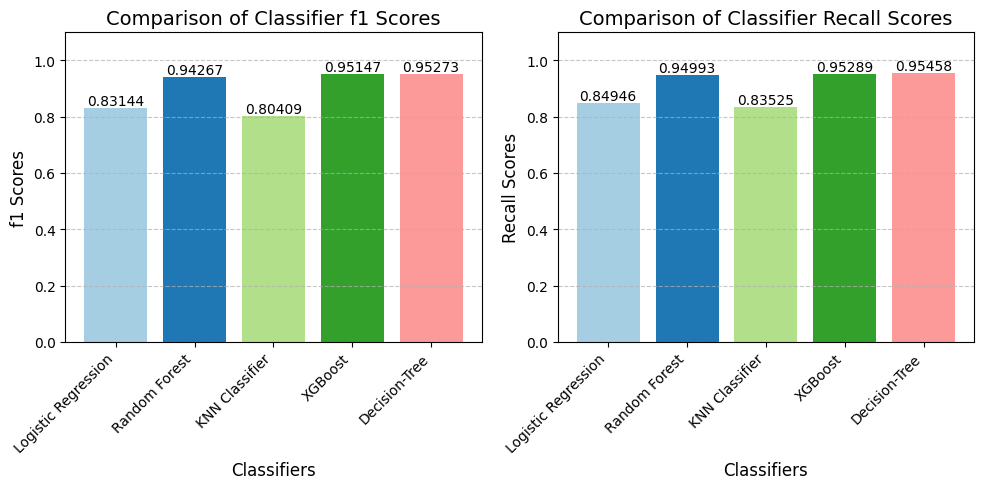

In [97]:
plt.figure(figsize=(10, 5))

plt.subplot(1,2,1) # Creates a grid of plots (1 row × 2 columns)

colors = plt.cm.Paired(np.arange(len(f1_scores)))  # Used a colormap for different bar colors
bars = plt.bar(f1_scores.keys(), f1_scores.values(), color=colors)

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.5f}', ha='center', va='bottom', fontsize=10)

plt.xlabel('Classifiers', fontsize=12)
plt.ylabel('f1 Scores', fontsize=12)
plt.title('Comparison of Classifier f1 Scores', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.ylim(0, 1.1)  # Extend limit slightly above 1 for better visibility of text
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.subplot(1,2,2)

colors = plt.cm.Paired(np.arange(len(recall_scores)))  # Used a colormap for different bar colors
bars = plt.bar(recall_scores.keys(), recall_scores.values(), color=colors)

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.5f}', ha='center', va='bottom', fontsize=10)

plt.xlabel('Classifiers', fontsize=12)
plt.ylabel('Recall Scores', fontsize=12)
plt.title('Comparison of Classifier Recall Scores', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.ylim(0, 1.1)  # Extend limit slightly above 1 for better visibility of text
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()

# Comments on Model Evaluation 
Among these 5 models Decision Tree shows highest accuracy and better performance compared to other 4 models

# 5. Hyperparameter Tuning
- Optimize hyperparameters for each model using systematic search methods.
- Identify the best configuration for improved performance.


In [98]:
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV

### Logistic Regression Hyperparameters tuning

In [99]:
lg_params = {
    "classifier__penalty": ["l2", "l1"],
    "classifier__C": [0.01, 0.1, 10, 100],
    "classifier__solver": ["liblinear", "saga"],
    "classifier__max_iter": [500, 1000]
}

In [100]:
lg_random_search = RandomizedSearchCV(
    estimator=model_pipeline_lg_reg, param_distributions=lg_params, 
    n_iter=30, cv=3, scoring="accuracy", random_state=42, verbose=2)

In [101]:
lg_random_search.fit(x_train, y_train)

Fitting 3 folds for each of 30 candidates, totalling 90 fits
[CV] END classifier__C=100, classifier__max_iter=1000, classifier__penalty=l2, classifier__solver=saga; total time=  59.8s
[CV] END classifier__C=100, classifier__max_iter=1000, classifier__penalty=l2, classifier__solver=saga; total time= 1.0min
[CV] END classifier__C=100, classifier__max_iter=1000, classifier__penalty=l2, classifier__solver=saga; total time=  59.7s
[CV] END classifier__C=0.1, classifier__max_iter=1000, classifier__penalty=l1, classifier__solver=saga; total time= 1.4min
[CV] END classifier__C=0.1, classifier__max_iter=1000, classifier__penalty=l1, classifier__solver=saga; total time= 1.4min
[CV] END classifier__C=0.1, classifier__max_iter=1000, classifier__penalty=l1, classifier__solver=saga; total time= 1.4min
[CV] END classifier__C=100, classifier__max_iter=500, classifier__penalty=l2, classifier__solver=liblinear; total time=  53.4s
[CV] END classifier__C=100, classifier__max_iter=500, classifier__penalty=

RandomizedSearchCV(cv=3,
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(transformers=[('num',
                                                                               Pipeline(steps=[('imputer',
                                                                                                SimpleImputer()),
                                                                                               ('scaler',
                                                                                                RobustScaler())]),
                                                                               ['Age',
                                                                                'Annual_Income',
                                                                                'Monthly_Inhand_Salary',
                                                                                'Num_Bank_Accounts',
                                                                                'Num_Credit_Card',
                                                                                'Interest_Rate',
                                                                                'Num_of_Loan',
                                                                                'Delay_from_due_date',
                                                                                'Num_of_Delayed_Payment',
                                                                                'Changed_Cr...
                                                                                'Payment_of_Min_Amount',
                                                                                'Payment_Behaviour'])])),
                                             ('resampler',
                                              SMOTETomek(random_state=42)),
                                             ('classifier',
                                              LogisticRegression())]),
                   n_iter=30,
                   param_distributions={'classifier__C': [0.01, 0.1, 10, 100],
                                        'classifier__max_iter': [500, 1000],
                                        'classifier__penalty': ['l2', 'l1'],
                                        'classifier__solver': ['liblinear',
                                                               'saga']},
                   random_state=42, scoring='accuracy', verbose=2)

In [102]:
lg_random_search.cv_results_

{'mean_fit_time': array([  60.10348169,   83.14599403,   54.48888914,   50.78831943,
          44.64386932,   50.79233384,   42.70092654,   50.84411184,
          44.78127503,   43.56610537,   43.42530966,   51.44938016,
          59.6191055 ,   59.80561678,   63.96427464, 2896.7911915 ,
          51.87373018,   42.27761968,   42.72650909,   57.72046892,
          61.40287002, 2157.50084861,   47.32583157,   47.22296921,
        4034.02266145,   53.77020995,   90.69184001,   93.18043168,
          92.48836096,  118.69598516]),
 'std_fit_time': array([ 0.4607033 ,  0.9023873 ,  0.7865006 ,  0.23865706,  0.22870969,
         0.30770907,  0.42341865,  0.2891973 ,  0.18372019,  0.1622555 ,
         0.23572294,  0.6061269 ,  0.33160544,  0.36765329,  0.63751989,
        10.60332621,  0.54291174,  0.3224448 ,  0.30713954,  0.34302712,
         0.30089834,  7.35687673,  2.92149346,  3.11813974, 15.08940272,
         0.1194354 , 24.09345197,  1.14942583,  0.84249818,  0.89267686]),
 'mean_scor

In [187]:
tuning_result_lg = pd.DataFrame(lg_random_search.cv_results_)
tuning_result_lg.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_classifier__solver,param_classifier__penalty,param_classifier__max_iter,param_classifier__C,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,60.103482,0.460703,0.069331,0.000473,saga,l2,1000,100.0,"{'classifier__solver': 'saga', 'classifier__pe...",0.831325,0.828553,0.828961,0.829613,0.001222,9
1,83.145994,0.902387,0.069658,0.001707,saga,l1,1000,0.1,"{'classifier__solver': 'saga', 'classifier__pe...",0.830686,0.826741,0.825976,0.827801,0.002064,16
2,54.488889,0.786501,0.067669,0.000965,liblinear,l2,500,100.0,"{'classifier__solver': 'liblinear', 'classifie...",0.941785,0.937307,0.937833,0.938975,0.001998,1
3,50.788319,0.238657,0.068998,0.000815,saga,l2,500,10.0,"{'classifier__solver': 'saga', 'classifier__pe...",0.827060,0.824715,0.823630,0.825135,0.001432,18
4,44.643869,0.228710,0.068332,0.000490,liblinear,l2,500,0.1,"{'classifier__solver': 'liblinear', 'classifie...",0.829086,0.827060,0.828215,0.828121,0.000830,14


In [188]:
# Sort by rank_test_score (1 = best, 2 = second best, etc.)
sorted_results_lg = tuning_result_lg.sort_values('rank_test_score')
sorted_results_lg

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_classifier__solver,param_classifier__penalty,param_classifier__max_iter,param_classifier__C,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
2,54.488889,0.786501,0.067669,0.000965,liblinear,l2,500,100.00,"{'classifier__solver': 'liblinear', 'classifie...",0.941785,0.937307,0.937833,0.938975,0.001998,1
29,118.695985,0.892677,0.171948,0.005960,liblinear,l2,1000,100.00,"{'classifier__solver': 'liblinear', 'classifie...",0.941785,0.937307,0.937833,0.938975,0.001998,1
25,53.770210,0.119435,0.071337,0.001712,liblinear,l2,1000,10.00,"{'classifier__solver': 'liblinear', 'classifie...",0.936560,0.934001,0.934634,0.935065,0.001088,3
11,51.449380,0.606127,0.068658,0.000474,liblinear,l2,500,10.00,"{'classifier__solver': 'liblinear', 'classifie...",0.936560,0.934001,0.934634,0.935065,0.001088,3
22,47.325832,2.921493,0.075999,0.008528,liblinear,l1,1000,10.00,"{'classifier__solver': 'liblinear', 'classifie...",0.925898,0.923979,0.926424,0.925434,0.001051,5
23,47.222969,3.118140,0.070348,0.000954,liblinear,l1,500,10.00,"{'classifier__solver': 'liblinear', 'classifie...",0.925152,0.924086,0.926850,0.925363,0.001138,6
18,42.726509,0.307140,0.069346,0.000489,liblinear,l1,500,100.00,"{'classifier__solver': 'liblinear', 'classifie...",0.924619,0.921633,0.919919,0.922057,0.001942,7
6,42.700927,0.423419,0.067668,0.000472,liblinear,l1,1000,100.00,"{'classifier__solver': 'liblinear', 'classifie...",0.924192,0.921633,0.920132,0.921986,0.001676,8
24,4034.022661,15.089403,0.077332,0.005315,saga,l1,1000,100.00,"{'classifier__solver': 'saga', 'classifier__pe...",0.831325,0.828553,0.828961,0.829613,0.001222,9
20,61.402870,0.300898,0.070002,0.000842,saga,l2,1000,10.00,"{'classifier__solver': 'saga', 'classifier__pe...",0.831325,0.828553,0.828961,0.829613,0.001222,9


In [103]:
lg_random_search.best_params_

{'classifier__solver': 'liblinear',
 'classifier__penalty': 'l2',
 'classifier__max_iter': 500,
 'classifier__C': 100}

In [104]:
# Using best tuned model on the untouched test set
lg_best_model = lg_random_search.best_estimator_  # or whatever tuned model is
lg_final_predictions = lg_best_model.predict(x_test)

# Checking the final performance
from sklearn.metrics import accuracy_score, classification_report
lg_final_accuracy = accuracy_score(y_test, lg_final_predictions)
print(f"Final Test Accuracy for lg: {lg_final_accuracy:.7f}")

Final Test Accuracy for lg: 0.9724687


In [105]:
conf_matrix_lg_bt = confusion_matrix(y_test, y_pred_lg) # y_test = original y, y_pred_lg=predicted y
conf_matrix_lg_at = confusion_matrix(y_test, lg_final_predictions)
print('Comparison of Confusion Matrix for Classifier Models')
print(f'Matrix before tuning: \n{conf_matrix_lg_bt}, \nMatrix after tuning: \n{conf_matrix_lg_at}')

Comparison of Confusion Matrix for Classifier Models
Matrix before tuning: 
[[2557  291    4]
 [ 535 3878 1058]
 [   0  213 3523]], 
Matrix after tuning: 
[[2777   73    2]
 [  39 5269  163]
 [   0   55 3681]]


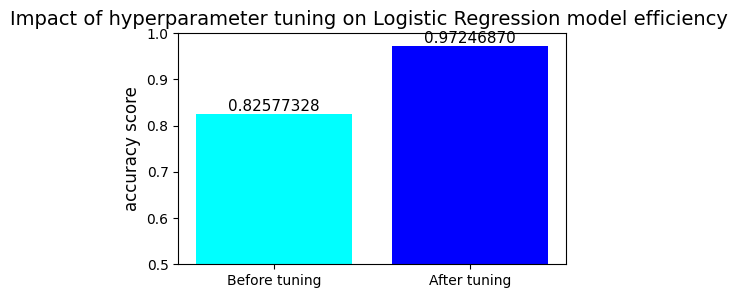

In [189]:
Tuning_Type = ['Before tuning', 'After tuning']
Logistic_Reg = [0.8257732813666141,  0.9724687  ]

plt.figure(figsize=(5,3))
x=np.arange(len(Tuning_Type))

bars = plt.bar(Tuning_Type, Logistic_Reg, color=['cyan', 'blue'])  #plt.bar() : Creates a bar chart in matplotlib 

for bar in bars:
    height = bar.get_height() # For each bar, gets its height (the y-value, which is the mae score).
    plt.text(bar.get_x() + bar.get_width()/2., # #bar.get_x(): Gets the bar's left-edge x-coordinate. #bar.get_width()/2.: Gets half the bar's width. # bar.get_x() + bar.get_width()/2.: Calculates the center of the bar.
             height,
             f'{height:.8f}',
             ha='center', va='bottom', fontsize=11)
    
plt.ylabel('accuracy score', fontsize=12)
plt.title('Impact of hyperparameter tuning on Logistic Regression model efficiency ', fontsize=14)
plt.ylim(0.5, 1.0)
plt.show()    #Displays the complete figure with all subplots

In [107]:
print("Logistic Regression Classification Report Before Tuning:")
print(classification_report(y_test, y_pred_lg))
print("Logistic Regression Classification Report AfterTuning:")
print(classification_report(y_test, lg_final_predictions))

Logistic Regression Classification Report Before Tuning:
              precision    recall  f1-score   support

         0.0       0.83      0.90      0.86      2852
         1.0       0.88      0.71      0.79      5471
         2.0       0.77      0.94      0.85      3736

    accuracy                           0.83     12059
   macro avg       0.83      0.85      0.83     12059
weighted avg       0.84      0.83      0.82     12059

Logistic Regression Classification Report AfterTuning:
              precision    recall  f1-score   support

         0.0       0.99      0.97      0.98      2852
         1.0       0.98      0.96      0.97      5471
         2.0       0.96      0.99      0.97      3736

    accuracy                           0.97     12059
   macro avg       0.97      0.97      0.97     12059
weighted avg       0.97      0.97      0.97     12059



### Decision Tree Hyperparameter Tuning

In [126]:
dt_params = {
    "classifier__max_depth": [5, 20, None],
    "classifier__min_samples_split": [2, 5, 10],
    "classifier__min_samples_leaf": [1, 2, 5],
    "classifier__max_features": ["sqrt", "log2", None],
    "classifier__criterion": ["gini", "entropy"]
}

In [127]:
dt_random_search = RandomizedSearchCV(
    estimator=model_pipeline_dt_clf, param_distributions=dt_params, 
    n_iter=30, cv=3, scoring="accuracy", random_state=42, verbose=2)

In [128]:
dt_random_search.fit(x_train, y_train)

Fitting 3 folds for each of 30 candidates, totalling 90 fits
[CV] END classifier__criterion=entropy, classifier__max_depth=None, classifier__max_features=None, classifier__min_samples_leaf=2, classifier__min_samples_split=10; total time= 1.7min
[CV] END classifier__criterion=entropy, classifier__max_depth=None, classifier__max_features=None, classifier__min_samples_leaf=2, classifier__min_samples_split=10; total time= 1.7min
[CV] END classifier__criterion=entropy, classifier__max_depth=None, classifier__max_features=None, classifier__min_samples_leaf=2, classifier__min_samples_split=10; total time= 1.5min
[CV] END classifier__criterion=entropy, classifier__max_depth=20, classifier__max_features=sqrt, classifier__min_samples_leaf=1, classifier__min_samples_split=5; total time= 1.3min
[CV] END classifier__criterion=entropy, classifier__max_depth=20, classifier__max_features=sqrt, classifier__min_samples_leaf=1, classifier__min_samples_split=5; total time= 1.4min
[CV] END classifier__crit

RandomizedSearchCV(cv=3,
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(transformers=[('num',
                                                                               Pipeline(steps=[('imputer',
                                                                                                SimpleImputer()),
                                                                                               ('scaler',
                                                                                                RobustScaler())]),
                                                                               ['Age',
                                                                                'Annual_Income',
                                                                                'Monthly_Inhand_Salary',
                                                                                'Num_Bank_Accounts',
                                                                                'Num_Credit_Card',
                                                                                'Interest_Rate',
                                                                                'Num_of_Loan',
                                                                                'Delay_from_due_date',
                                                                                'Num_of_Delayed_Payment',
                                                                                'Changed_Cr...
                                              SMOTETomek(random_state=42)),
                                             ('classifier',
                                              DecisionTreeClassifier())]),
                   n_iter=30,
                   param_distributions={'classifier__criterion': ['gini',
                                                                  'entropy'],
                                        'classifier__max_depth': [5, 20, None],
                                        'classifier__max_features': ['sqrt',
                                                                     'log2',
                                                                     None],
                                        'classifier__min_samples_leaf': [1, 2,
                                                                         5],
                                        'classifier__min_samples_split': [2, 5,
                                                                          10]},
                   random_state=42, scoring='accuracy', verbose=2)

In [129]:
dt_random_search.cv_results_

{'mean_fit_time': array([98.20095865, 79.34412169, 93.8989714 , 89.72226135, 87.00412536,
        84.35270174, 89.86531425, 85.40360332, 85.50516121, 94.61773721,
        89.94163227, 79.8639106 , 81.13707638, 80.89643709, 77.32737803,
        78.81477865, 74.16329145, 74.68485729, 75.01522319, 71.72455772,
        76.1178751 , 72.39517482, 72.27976433, 73.95812837, 73.22318761,
        74.92136574, 71.21178563, 75.05437191, 73.10470247, 73.40321668]),
 'std_fit_time': array([ 6.35133438,  1.43391446, 10.31099343,  1.30213085,  2.25199279,
         4.33049296,  2.27584076,  2.32653087,  3.18268309,  4.05888324,
         3.95485332,  4.69462716,  0.64751263,  6.36886672,  3.51506969,
         1.21014689,  2.47531074,  1.94145311,  1.91063155,  1.05736782,
         2.26414424,  2.30295021,  2.12602793,  2.00221883,  1.18399231,
         1.88604421,  1.11179496,  0.87608105,  0.49801113,  0.11727577]),
 'mean_score_time': array([0.46679235, 0.4311103 , 0.46192503, 0.47577071, 0.44284193,


In [130]:
dt_random_search.best_params_

{'classifier__min_samples_split': 2,
 'classifier__min_samples_leaf': 1,
 'classifier__max_features': None,
 'classifier__max_depth': None,
 'classifier__criterion': 'entropy'}

In [131]:
# Using best tuned model on the untouched test set
dt_best_model = dt_random_search.best_estimator_  # or whatever tuned model is
dt_final_predictions = dt_best_model.predict(x_test)

# Checking the final performance
from sklearn.metrics import accuracy_score, classification_report
dt_final_accuracy = accuracy_score(y_test, dt_final_predictions)
print(f"Final Test Accuracy for dt: {dt_final_accuracy:.7f}")

Final Test Accuracy for dt: 0.9424496


In [132]:
# Using best tuned model on the untouched test set
dt_best_model = dt_random_search.best_estimator_  # or whatever tuned model is
dt_val_predictions = dt_best_model.predict(xvalidation)
# validation checking for tuned model performance
dt_val_accuracy = accuracy_score(yvalidation, dt_val_predictions)
print(f"Final Test Accuracy for dt on validation test set: {dt_val_accuracy:.7f}")

Final Test Accuracy for dt on validation test set: 0.9424544


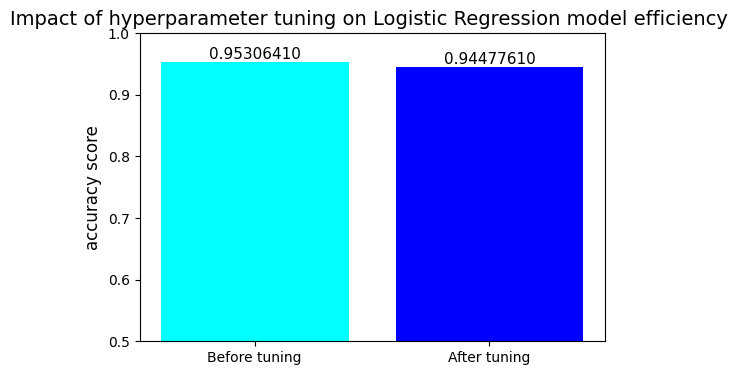

In [133]:
Tuning_Type = ['Before tuning', 'After tuning']
Decision_tree = [0.9530641, 0.9447761  ]

plt.figure(figsize=(6,4))
x=np.arange(len(Tuning_Type))

bars = plt.bar(Tuning_Type, Decision_tree, color=['cyan', 'blue'])  #plt.bar() : Creates a bar chart in matplotlib 

for bar in bars:
    height = bar.get_height() # For each bar, gets its height (the y-value, which is the mae score).
    plt.text(bar.get_x() + bar.get_width()/2., # #bar.get_x(): Gets the bar's left-edge x-coordinate. #bar.get_width()/2.: Gets half the bar's width. # bar.get_x() + bar.get_width()/2.: Calculates the center of the bar.
             height,
             f'{height:.8f}',
             ha='center', va='bottom', fontsize=11)
    
plt.ylabel('accuracy score', fontsize=12)
plt.title('Impact of hyperparameter tuning on Logistic Regression model efficiency ', fontsize=14)
plt.ylim(0.5, 1.0)
plt.show()    #Displays the complete figure with all subplots

In [134]:
conf_matrix_dt_bt = confusion_matrix(y_test, y_pred_dt) # y_test = original y, y_pred_lg=predicted y
conf_matrix_dt_at = confusion_matrix(y_test, dt_final_predictions)
print('Comparison of Confusion Matrix for Classifier Models')
print(f'Matrix before tuning: \n{conf_matrix_dt_bt}, \nMatrix after tuning: \n{conf_matrix_dt_at}')

Comparison of Confusion Matrix for Classifier Models
Matrix before tuning: 
[[2745  107    0]
 [ 145 5130  196]
 [   0  136 3600]], 
Matrix after tuning: 
[[2740  112    0]
 [ 149 5088  234]
 [   0  199 3537]]


In [135]:
recall_scores_dt_bt = recall_score(y_test, y_pred_dt, average='macro') # y_test = original y, y_pred_lg=predicted y
recall_scores_dt_at = recall_score(y_test, dt_final_predictions, average='macro')
print('Comparison of Recall scores for Classifier Models')
print(f'Recall scores before tuning: \n{recall_scores_dt_bt}, \nRecall after tuning: \n{recall_scores_dt_at}')

Comparison of Recall scores for Classifier Models
Recall scores before tuning: 
0.9545837523066242, 
Recall after tuning: 
0.9458194348931571


In [136]:
f1_scores_dt_bt = f1_score(y_test, y_pred_dt, average='macro') # y_test = original y, y_pred_lg=predicted y
f1_scores_dt_at = f1_score(y_test, dt_final_predictions, average='macro')
print('Comparison of Recall scores for Classifier Models')
print(f'f1 scores before tuning: \n{f1_scores_dt_bt}, \nf1 scores after tuning: \n{f1_scores_dt_at}')

Comparison of Recall scores for Classifier Models
f1 scores before tuning: 
0.9527265295025966, 
f1 scores after tuning: 
0.9443375305660545


In [137]:
print("Decision Tree Classification Report Before Tuning:")
print(classification_report(y_test, y_pred_dt))
print("Decision Tree Classification Report AfterTuning:")
print(classification_report(y_test, dt_final_predictions))

Decision Tree Classification Report Before Tuning:
              precision    recall  f1-score   support

         0.0       0.95      0.96      0.96      2852
         1.0       0.95      0.94      0.95      5471
         2.0       0.95      0.96      0.96      3736

    accuracy                           0.95     12059
   macro avg       0.95      0.95      0.95     12059
weighted avg       0.95      0.95      0.95     12059

Decision Tree Classification Report AfterTuning:
              precision    recall  f1-score   support

         0.0       0.95      0.96      0.95      2852
         1.0       0.94      0.93      0.94      5471
         2.0       0.94      0.95      0.94      3736

    accuracy                           0.94     12059
   macro avg       0.94      0.95      0.94     12059
weighted avg       0.94      0.94      0.94     12059



### Comments on hyperparameter tuning of decision tree

- The default model testing accuracy is little bit lower than the tuned model testing accuracy for decision tree.
- the potential reasons may be not including the potential powerful parameters or narrow parameters for optimization search.
- Therefore missing the best parameters combinations during hyperparameter tuning.
- However, hyperparameter tuning optimize the validation matrics not the test accuracy.
- In addition, lower accuracy does not always mean worse robustness.

## Random Forest Hyperparameter tuning

In [108]:
rf_params = {
    'classifier__n_estimators': [ 100, 200, 300],
    'classifier__max_depth': [10, 50, None],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4],
    'classifier__max_features': ['sqrt', 'log2'],
    'classifier__criterion': ['gini'],
    'classifier__max_samples': [0.7, None]
}

In [109]:
rf_random_search = RandomizedSearchCV(estimator=model_pipeline_rf_clf,
                                      param_distributions=rf_params, n_iter=30, cv=3, scoring="accuracy", random_state=42, verbose=2)

In [110]:
rf_random_search.fit(x_train, y_train)

Fitting 3 folds for each of 30 candidates, totalling 90 fits
[CV] END classifier__criterion=gini, classifier__max_depth=50, classifier__max_features=sqrt, classifier__max_samples=0.7, classifier__min_samples_leaf=4, classifier__min_samples_split=10, classifier__n_estimators=100; total time= 1.7min
[CV] END classifier__criterion=gini, classifier__max_depth=50, classifier__max_features=sqrt, classifier__max_samples=0.7, classifier__min_samples_leaf=4, classifier__min_samples_split=10, classifier__n_estimators=100; total time= 1.7min
[CV] END classifier__criterion=gini, classifier__max_depth=50, classifier__max_features=sqrt, classifier__max_samples=0.7, classifier__min_samples_leaf=4, classifier__min_samples_split=10, classifier__n_estimators=100; total time= 1.7min
[CV] END classifier__criterion=gini, classifier__max_depth=50, classifier__max_features=sqrt, classifier__max_samples=0.7, classifier__min_samples_leaf=1, classifier__min_samples_split=2, classifier__n_estimators=100; total t

RandomizedSearchCV(cv=3,
                   estimator=Pipeline(steps=[('preprocessor',
                                              ColumnTransformer(transformers=[('num',
                                                                               Pipeline(steps=[('imputer',
                                                                                                SimpleImputer()),
                                                                                               ('scaler',
                                                                                                RobustScaler())]),
                                                                               ['Age',
                                                                                'Annual_Income',
                                                                                'Monthly_Inhand_Salary',
                                                                                'Num_Bank_Accounts',
                                                                                'Num_Credit_Card',
                                                                                'Interest_Rate',
                                                                                'Num_of_Loan',
                                                                                'Delay_from_due_date',
                                                                                'Num_of_Delayed_Payment',
                                                                                'Changed_Cr...
                                              RandomForestClassifier())]),
                   n_iter=30,
                   param_distributions={'classifier__criterion': ['gini'],
                                        'classifier__max_depth': [10, 50, None],
                                        'classifier__max_features': ['sqrt',
                                                                     'log2'],
                                        'classifier__max_samples': [0.7, None],
                                        'classifier__min_samples_leaf': [1, 2,
                                                                         4],
                                        'classifier__min_samples_split': [2, 5,
                                                                          10],
                                        'classifier__n_estimators': [100, 200,
                                                                     300]},
                   random_state=42, scoring='accuracy', verbose=2)

In [111]:
rf_random_search.cv_results_

{'mean_fit_time': array([101.15539376, 130.50258787, 229.39763904,  95.70747097,
         92.40863713, 101.94195906, 147.84535599, 100.77921017,
        134.68535026, 111.02426688, 128.18320028, 145.36408234,
        174.46844268, 164.10271343, 126.10888267, 285.58418028,
         79.49772072, 142.05799437,  83.40377633,  84.74146191,
         83.97673074, 258.518948  , 103.92267235,  84.52344124,
         86.07025099, 100.98514732,  89.58656152,  86.13639363,
         79.06042743,  81.40854184]),
 'std_fit_time': array([ 1.64933347,  1.74885054,  2.56059541,  0.939716  ,  1.04214276,
         1.22108505,  2.59471762,  0.99146455,  5.24062071,  3.17257181,
        26.05023623, 19.85660863,  3.59596027,  3.21358818,  3.51745619,
        81.53714611,  1.61876113,  7.55559691,  1.39140734,  2.54340471,
         2.82863202,  7.93118689,  4.02119438,  2.57342392,  4.26948689,
         0.70890348,  5.86001509,  3.36783713,  2.07924931,  3.21410072]),
 'mean_score_time': array([0.47816229, 0.

In [112]:
rf_random_search.best_params_

{'classifier__n_estimators': 300,
 'classifier__min_samples_split': 5,
 'classifier__min_samples_leaf': 1,
 'classifier__max_samples': None,
 'classifier__max_features': 'log2',
 'classifier__max_depth': None,
 'classifier__criterion': 'gini'}

In [115]:
# Using best tuned model on the untouched test set
best_model_rf = rf_random_search.best_estimator_  # or whatever tuned model is
rf_final_predictions = best_model_rf.predict(x_test)

# Checking the final performance
from sklearn.metrics import accuracy_score, classification_report
rf_final_accuracy = accuracy_score(y_test, rf_final_predictions)
print(f"Final Test Accuracy for rf: {final_accuracy:.7f}")

Final Test Accuracy for rf: 0.9380546


In [114]:
# Using best tuned model on the untouched test set
rf_best_model = rf_random_search.best_estimator_  # or whatever tuned model is
rf_val_predictions = rf_best_model.predict(xvalidation)
# validation checking for tuned model performance
rf_val_accuracy = accuracy_score(yvalidation, rf_val_predictions)
print(f"Final Test Accuracy for rf on validation test set: {rf_val_accuracy:.7f}")

Final Test Accuracy for rf on validation test set: 0.9361526


In [116]:
print("Decision Tree Classification Report Before Tuning:")
print(classification_report(y_test, y_pred_rf))
print("Decision Tree Classification Report AfterTuning:")
print(classification_report(y_test, rf_final_predictions))

Decision Tree Classification Report Before Tuning:
              precision    recall  f1-score   support

         0.0       0.92      0.98      0.95      2852
         1.0       0.96      0.90      0.93      5471
         2.0       0.93      0.97      0.95      3736

    accuracy                           0.94     12059
   macro avg       0.94      0.95      0.94     12059
weighted avg       0.94      0.94      0.94     12059

Decision Tree Classification Report AfterTuning:
              precision    recall  f1-score   support

         0.0       0.92      0.97      0.95      2852
         1.0       0.97      0.90      0.93      5471
         2.0       0.92      0.97      0.94      3736

    accuracy                           0.94     12059
   macro avg       0.93      0.95      0.94     12059
weighted avg       0.94      0.94      0.94     12059



xgb_params = {
    'classifier__n_estimators': [100, 200, 300],
    'classifier__max_depth': [4, 6, 8],
    'classifier__learning_rate': [0.05, 0.1],
    'classifier__subsample': [0.7, 0.8, 0.9],
    'classifier__colsample_bytree': [0.7, 0.9]
}

from xgboost import XGBClassifier

xgb = XGBClassifier(n_estimators=100, objective='multi:softmax', random_state=42) 

xgb_random_search = RandomizedSearchCV(estimator=model_pipeline_xgb_clf,
                                      param_distributions=xgb_params, n_iter=50, cv=3, random_state=42)

xgb_random_search.fit(x_train, y_train)

xgb_random_search.cv_results_

xgb_random_search.best_params_

tuning_result_xgb = pd.DataFrame(xgb_random_search.cv_results_)
tuning_result_xgb.head()

# 6. Retrain Models
- Retrain all models using the optimal hyperparameters on the training data.
- Validate the models on unseen data to ensure robustness.

### Logistic Regression Retraining

In [117]:
best_model_lg = lg_random_search.best_estimator_ 
best_model_lg.fit(x_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   RobustScaler())]),
                                                  ['Age', 'Annual_Income',
                                                   'Monthly_Inhand_Salary',
                                                   'Num_Bank_Accounts',
                                                   'Num_Credit_Card',
                                                   'Interest_Rate',
                                                   'Num_of_Loan',
                                                   'Delay_from_due_date',
                                                   'Num_of_Delayed_Payment',
                                                   'Changed_Credit_Limit',
                                                   'Num_Credit_Inquiries'...
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['Month', 'SSN', 'Occupation',
                                                   'Type_of_Loan',
                                                   'Credit_History_Age',
                                                   'Payment_of_Min_Amount',
                                                   'Payment_Behaviour'])])),
                ('resampler', SMOTETomek(random_state=42)),
                ('classifier',
                 LogisticRegression(C=100, max_iter=500, solver='liblinear'))])

In [119]:
y_pred_lg_final = best_model_lg.predict(xvalidation)
AccuracyScore_ht=accuracy_score(yvalidation, y_pred_lg_final)
print(f'"Testing Accuracy for Logistic Regression after hyperparameter tuning:" {AccuracyScore_ht:.8f}')

"Testing Accuracy for Logistic Regression after hyperparameter tuning:", 0.97247098


In [121]:
print(f'f1-score:{f1_score(yvalidation, y_pred_lg_final,average='macro')},\nprecision-score:{precision_score(yvalidation, y_pred_lg_final,average='macro')},\nrecall-score:{recall_score(yvalidation, y_pred_lg_final,average='macro')}')

f1-score:0.973596602437652,
precision-score:0.972888357721773,
recall-score:0.9745075276692113


### Random Forest Retraining

In [122]:
best_model_rf = rf_random_search.best_estimator_ 
best_model_rf.fit(x_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   RobustScaler())]),
                                                  ['Age', 'Annual_Income',
                                                   'Monthly_Inhand_Salary',
                                                   'Num_Bank_Accounts',
                                                   'Num_Credit_Card',
                                                   'Interest_Rate',
                                                   'Num_of_Loan',
                                                   'Delay_from_due_date',
                                                   'Num_of_Delayed_Payment',
                                                   'Changed_Credit_Limit',
                                                   'Num_Credit_Inquiries'...
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['Month', 'SSN', 'Occupation',
                                                   'Type_of_Loan',
                                                   'Credit_History_Age',
                                                   'Payment_of_Min_Amount',
                                                   'Payment_Behaviour'])])),
                ('resampler', SMOTETomek(random_state=42)),
                ('classifier',
                 RandomForestClassifier(max_features='log2',
                                        min_samples_split=5,
                                        n_estimators=300))])

In [123]:
y_pred_rf_final = best_model_rf.predict(xvalidation)
AccuracyScore_ht=accuracy_score(yvalidation, y_pred_rf_final)
print(f'"Testing Accuracy for RF after hyperparameter tuning:", {AccuracyScore_ht:.8f}')

"Testing Accuracy for RF after hyperparameter tuning:", 0.93864013


In [124]:
print(f'f1-score:{f1_score(yvalidation, y_pred_rf_final,average='macro')},\nprecision-score:{precision_score(yvalidation, y_pred_rf_final,average='macro')},\nrecall-score:{recall_score(yvalidation, y_pred_rf_final,average='macro')}')

f1-score:0.9404720995650444,
precision-score:0.9341565599214917,
recall-score:0.9491505552621168


### Decision Tree Retraining

In [138]:
best_model_dt = dt_random_search.best_estimator_ 
best_model_dt.fit(x_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   RobustScaler())]),
                                                  ['Age', 'Annual_Income',
                                                   'Monthly_Inhand_Salary',
                                                   'Num_Bank_Accounts',
                                                   'Num_Credit_Card',
                                                   'Interest_Rate',
                                                   'Num_of_Loan',
                                                   'Delay_from_due_date',
                                                   'Num_of_Delayed_Payment',
                                                   'Changed_Credit_Limit',
                                                   'Num_Credit_Inquiries'...
                                                   'Monthly_Balance']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['Month', 'SSN', 'Occupation',
                                                   'Type_of_Loan',
                                                   'Credit_History_Age',
                                                   'Payment_of_Min_Amount',
                                                   'Payment_Behaviour'])])),
                ('resampler', SMOTETomek(random_state=42)),
                ('classifier', DecisionTreeClassifier(criterion='entropy'))])

In [139]:
y_pred_dt_final = best_model_dt.predict(xvalidation)
AccuracyScore_ht=accuracy_score(yvalidation, y_pred_dt_final)
print(f'"Testing Accuracy for Decision Tree after hyperparameter tuning:", {AccuracyScore_ht:.8f}')

"Testing Accuracy for Decision Tree after hyperparameter tuning:", 0.94129353


In [140]:
print(f'f1-score:{f1_score(yvalidation, y_pred_dt_final,average='macro')},\nprecision-score:{precision_score(yvalidation, y_pred_dt_final,average='macro')},\nrecall-score:{recall_score(yvalidation, y_pred_dt_final,average='macro')}')

f1-score:0.9431500078297517,
precision-score:0.9409177406526129,
recall-score:0.9455530385880119


# 7. Final Performance and Cross-Validation
- Evaluate the final performance of each model using cross-validation scores.
- Compare results to select the best-performing model.


## Perform Stratified K-Fold Cross-Validation to ensure class balance during cross-validation.

In [142]:
from sklearn.model_selection import KFold, cross_val_score
from sklearn.model_selection import StratifiedKFold
strat_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

### Cross-validation on Logistic Regression Model

In [143]:
strat_kfold_scores_lg = cross_val_score(model_pipeline_lg_reg, x_train, y_train, cv=strat_kfold, scoring='accuracy')
strat_kfold_scores_lg

array([0.82995736, 0.83028257, 0.82530656, 0.82761685, 0.82566199])

In [144]:
strat_kfold_scores_lg_ht = cross_val_score(best_model_lg, x_train, y_train, cv=strat_kfold, scoring='accuracy')
strat_kfold_scores_lg_ht

array([0.95167022, 0.95095077, 0.95183935, 0.95112849, 0.95361649])

In [149]:
lg_strt_kfold_mean= strat_kfold_scores_lg_ht.mean()
lg_strt_kfold_std= strat_kfold_scores_lg_ht.std()

print(f'The stratified kfold mean value for logistic regression: \n{lg_strt_kfold_mean:.8f};\nThe stratified kfold standard deviation for logistic regression: \n{lg_strt_kfold_std:.8f}')

The stratified kfold mean value for logistic regression: 
0.95184106;
The stratified kfold standard deviation for logistic regression: 
0.00094675


In [169]:
strat_kfold_scores_lg_ht_f1 = cross_val_score(best_model_lg, x_train, y_train, cv=strat_kfold, scoring='f1_macro')
strat_kfold_scores_lg_ht_f1

array([0.95375335, 0.95295705, 0.95364992, 0.95341136, 0.956096  ])

In [170]:
strat_kfold_scores_lg_ht_rcl = cross_val_score(best_model_lg, x_train, y_train, cv=strat_kfold, scoring='recall_macro')
strat_kfold_scores_lg_ht_rcl

array([0.9563609 , 0.95568008, 0.9568132 , 0.95684056, 0.95924928])

In [171]:
lg_strt_kfold_f1_mean= strat_kfold_scores_lg_ht_f1.mean()
lg_strt_kfold_recall_mean= strat_kfold_scores_lg_ht_rcl.mean()
print(f'The stratified kfold f1 scores for Logistic Regression: {lg_strt_kfold_f1_mean:.8f}')
print(f'\nThe stratified kfold recall scores for Logistic Regression: {lg_strt_kfold_recall_mean:.8f}')

The stratified kfold f1 scores for Logistic Regression: 0.95397354

The stratified kfold recall scores for Logistic Regression: 0.95698881


### Comments:
- With 5-fold stratified cross-validation, logistic regression model achieves about 95% accuracy, when trained on 80% of the data and tested on 20%, averaged over 5 different splits.

### Cross-validation on Random Forest Model

In [145]:
strat_kfold_scores_rf = cross_val_score(model_pipeline_rf_clf, x_train, y_train, cv=strat_kfold, scoring='accuracy')
strat_kfold_scores_rf

array([0.9362118 , 0.93673361, 0.93602275, 0.93406789, 0.93993247])

In [150]:
strat_kfold_scores_rf_ht = cross_val_score(best_model_rf, x_train, y_train, cv=strat_kfold, scoring='accuracy')
strat_kfold_scores_rf_ht

array([0.92821606, 0.93371246, 0.93460103, 0.93246846, 0.93495646])

In [190]:
rf_strt_kfold_mean= strat_kfold_scores_rf_ht.mean()
rf_strt_kfold_std= strat_kfold_scores_rf_ht.std()
print(f'The stratified kfold mean value for Random Forest: {rf_strt_kfold_mean:.8f}')
print(f'\nThe stratified kfold standard deviation for Random Forest: {rf_strt_kfold_std:.8f}')

The stratified kfold mean value for Random Forest: 0.93279089

The stratified kfold standard deviation for Random Forest: 0.00244330


In [172]:
strat_kfold_scores_rf_ht_f1 = cross_val_score(best_model_rf, x_train, y_train, cv=strat_kfold, scoring='f1_macro')
strat_kfold_scores_rf_ht_f1

array([0.93385729, 0.93494085, 0.93190087, 0.9312276 , 0.93867451])

In [173]:
strat_kfold_scores_rf_ht_rcl = cross_val_score(best_model_rf, x_train, y_train, cv=strat_kfold, scoring='recall_macro')
strat_kfold_scores_rf_ht_rcl

array([0.9406987 , 0.94419115, 0.94336922, 0.94335063, 0.94726026])

In [174]:
rf_strt_kfold_f1_mean= strat_kfold_scores_rf_ht_f1.mean()
rf_strt_kfold_recall_mean= strat_kfold_scores_rf_ht_rcl.mean()
print(f'The stratified kfold f1 scores for Random Forest: {rf_strt_kfold_f1_mean:.8f}')
print(f'\nThe stratified kfold recall scores for Random Forest: {rf_strt_kfold_recall_mean:.8f}')

The stratified kfold f1 scores for Random Forest: 0.93412022

The stratified kfold recall scores for Random Forest: 0.94377399


### Cross-validation on Decision Tree Model

In [152]:
strat_kfold_scores_dt = cross_val_score(model_pipeline_dt_clf, x_train, y_train, cv=strat_kfold, scoring='accuracy')
strat_kfold_scores_dt

array([0.945629  , 0.9427759 , 0.94437533, 0.94099876, 0.94633019])

In [153]:
strat_kfold_scores_dt_ht = cross_val_score(best_model_dt, x_train, y_train, cv=strat_kfold, scoring='accuracy')
strat_kfold_scores_dt_ht

array([0.93692253, 0.94064333, 0.93815532, 0.93673361, 0.94313133])

In [154]:
dt_strt_kfold_mean= strat_kfold_scores_dt_ht.mean()
dt_strt_kfold_std= strat_kfold_scores_dt_ht.std()

print(f'The stratified kfold mean value for Decision Tree: {dt_strt_kfold_mean:.8f}')
print(f'\nThe stratified kfold standard deviation for Decision Tree: {dt_strt_kfold_std:.8f}')

The stratified kfold mean value for Decision Tree: 0.93911722

The stratified kfold standard deviation for Decision Tree: 0.00244400


In [175]:
strat_kfold_scores_dt_ht_f1 = cross_val_score(best_model_dt, x_train, y_train, cv=strat_kfold, scoring='f1_macro')
strat_kfold_scores_dt_ht_f1

array([0.94083949, 0.94255291, 0.9376554 , 0.93901134, 0.94366671])

In [176]:
strat_kfold_scores_dt_ht_rcl = cross_val_score(best_model_dt, x_train, y_train, cv=strat_kfold, scoring='recall_macro')
strat_kfold_scores_dt_ht_rcl

array([0.93889117, 0.94233297, 0.94038863, 0.94057789, 0.94294513])

In [178]:
dt_strt_kfold_f1_mean= strat_kfold_scores_dt_ht_f1.mean()
dt_strt_kfold_recall_mean= strat_kfold_scores_dt_ht_rcl.mean()
print(f'The stratified kfold f1 scores for Decision Tree: {dt_strt_kfold_f1_mean:.8f}')
print(f'\nThe stratified kfold recall scores for Decision Tree: {dt_strt_kfold_recall_mean:.8f}')

The stratified kfold f1 scores for Decision Tree: 0.94074517

The stratified kfold recall scores for Decision Tree: 0.94102716


# Visualization of model accuracy after hyperparameter tuning and cross-validation 

In [179]:
accuracy_scores_ht = {
    "Logistic Regression": lg_strt_kfold_mean,
    "Random Forest" : rf_strt_kfold_mean,
    "Decision-Tree": dt_strt_kfold_mean
}

std_ht = {
    "Logistic Regression": lg_strt_kfold_std,
    "Random Forest" : rf_strt_kfold_std,
    "Decision-Tree": dt_strt_kfold_std
}

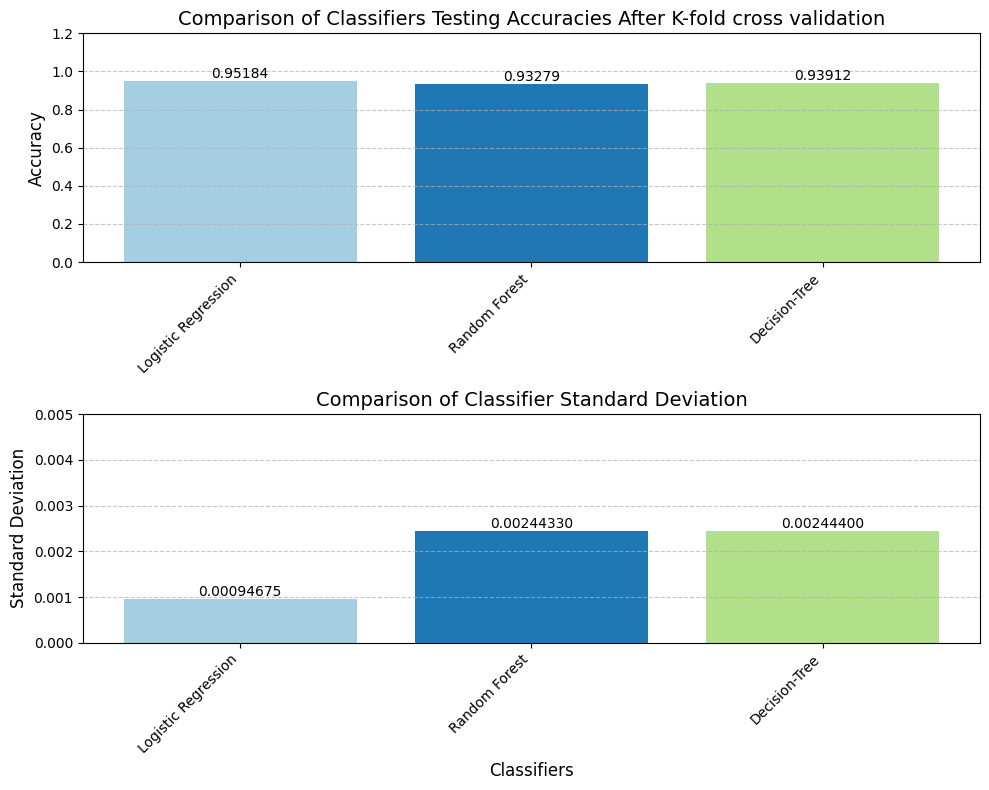

In [180]:
plt.figure(figsize=(10,8))

plt.subplot(2,1,1) # Creates a grid of plots (2 row × 1 columns)

colors = plt.cm.Paired(np.arange(len(accuracy_scores_ht)))  # Used a colormap for different bar colors
bars = plt.bar(accuracy_scores_ht.keys(), accuracy_scores_ht.values(), color=colors)

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.5f}', ha='center', va='bottom', fontsize=10)

#plt.xlabel('Classifiers', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.title('Comparison of Classifiers Testing Accuracies After K-fold cross validation', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.ylim(0, 1.2)  # Extend limit slightly above 1 for better visibility of text
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.subplot(2,1,2)

colors = plt.cm.Paired(np.arange(len(std_ht)))  # Used a colormap for different bar colors
bars = plt.bar(std_ht.keys(), std_ht.values(), color=colors)

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.8f}', ha='center', va='bottom', fontsize=10)

plt.xlabel('Classifiers', fontsize=12)
plt.ylabel('Standard Deviation', fontsize=12)
plt.title('Comparison of Classifier Standard Deviation', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.ylim(0, 0.005)  # Extend limit slightly above 1 for better visibility of text
plt.grid(axis='y', linestyle='--', alpha=0.7)


# Show the plot
plt.tight_layout()
plt.show()


In [181]:
kfold_f1_scores = {
    "Logistic Regression": lg_strt_kfold_f1_mean,
    "Random Forest" : rf_strt_kfold_f1_mean,
    "Decision-Tree": dt_strt_kfold_f1_mean
}

kfold_recall_scores = {
    "Logistic Regression": lg_strt_kfold_recall_mean,
    "Random Forest" : rf_strt_kfold_recall_mean,
    "Decision-Tree": dt_strt_kfold_recall_mean
}

In [183]:
f1_scores_before = {
    "Logistic Regression": f1_score(y_test, y_pred_lg, average='macro'),
    "Random Forest" : f1_score(y_test, y_pred_rf, average='macro'),
    "Decision-Tree": f1_score(y_test, y_pred_dt, average='macro')
}

recall_scores_before = {
    "Logistic Regression": recall_score(y_test, y_pred_lg, average='macro'),
    "Random Forest" : recall_score(y_test, y_pred_rf, average='macro'),
    "Decision-Tree": recall_score(y_test, y_pred_dt, average='macro')
}

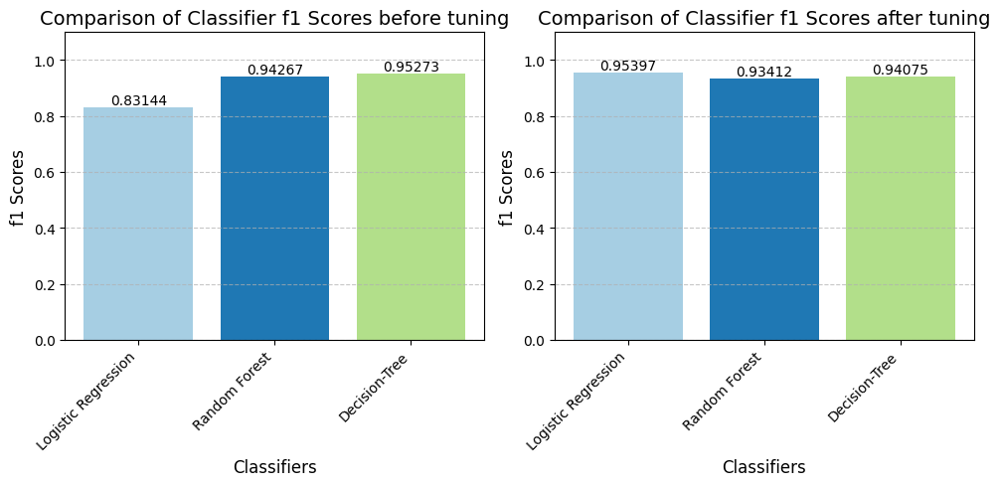

In [184]:
plt.figure(figsize=(10, 5))

plt.subplot(1,2,1) # Creates a grid of plots (1 row × 2 columns)
colors = plt.cm.Paired(np.arange(len(f1_scores_before)))  # Used a colormap for different bar colors
bars = plt.bar(f1_scores_before.keys(), f1_scores_before.values(), color=colors)

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.5f}', ha='center', va='bottom', fontsize=10)

plt.xlabel('Classifiers', fontsize=12)
plt.ylabel('f1 Scores', fontsize=12)
plt.title('Comparison of Classifier f1 Scores before tuning', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.ylim(0, 1.1)  # Extend limit slightly above 1 for better visibility of text
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.subplot(1,2,2)
colors = plt.cm.Paired(np.arange(len(kfold_f1_scores)))  # Used a colormap for different bar colors
bars = plt.bar(kfold_f1_scores.keys(), kfold_f1_scores.values(), color=colors)

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.5f}', ha='center', va='bottom', fontsize=10)

plt.xlabel('Classifiers', fontsize=12)
plt.ylabel('f1 Scores', fontsize=12)
plt.title('Comparison of Classifier f1 Scores after tuning', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.ylim(0, 1.1)  # Extend limit slightly above 1 for better visibility of text
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()

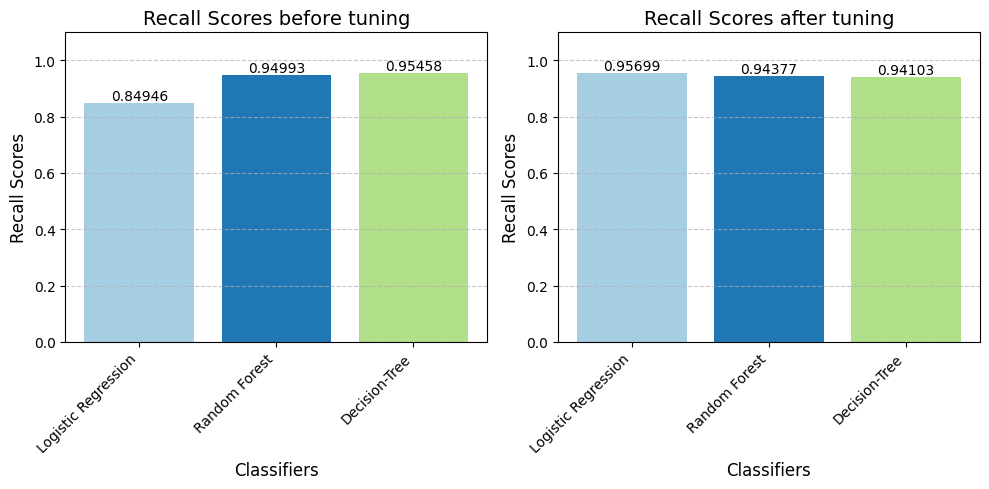

In [186]:
plt.figure(figsize=(10, 5))

plt.subplot(1,2,1) # Creates a grid of plots (1 row × 2 columns)
colors = plt.cm.Paired(np.arange(len(recall_scores_before)))  # Used a colormap for different bar colors
bars = plt.bar(recall_scores_before.keys(), recall_scores_before.values(), color=colors)

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.5f}', ha='center', va='bottom', fontsize=10)

plt.xlabel('Classifiers', fontsize=12)
plt.ylabel('Recall Scores', fontsize=12)
plt.title('Recall Scores before tuning', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.ylim(0, 1.1)  # Extend limit slightly above 1 for better visibility of text
plt.grid(axis='y', linestyle='--', alpha=0.7)



plt.subplot(1,2,2)

colors = plt.cm.Paired(np.arange(len(kfold_recall_scores)))  # Used a colormap for different bar colors
bars = plt.bar(kfold_recall_scores.keys(), kfold_recall_scores.values(), color=colors)

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.5f}', ha='center', va='bottom', fontsize=10)

plt.xlabel('Classifiers', fontsize=12)
plt.ylabel('Recall Scores', fontsize=12)
plt.title('Recall Scores after tuning', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.ylim(0, 1.1)  # Extend limit slightly above 1 for better visibility of text
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.tight_layout()
plt.show()

# 8. Suggestions
- Provide recommendations based on the model insights and analysis.
- Suggest actionable steps to improve outcomes or address any gaps identified during the project.


# Comments on analysis
- Out of 5 models (logistic regression, random forest, KNN, XGBoost and Decision Tree) the Decision tree showed better accuracy for default settings where testing accuracy was 0.95157144 compared to other models default settings.
- However, after hyperparameter tuning and cross validation analysis the logistic regression model showed better performance in terms of accuracy  and standard deviation compared to other models. After hyperparameter tuning the accuracy score was 0.9724687.
- After hyperparameter tuning the recall scores of logistic regression model outperforms other two models(random forest and decision tree).
- Due to resource scarcity randmoized search is performed insetead of grid search for hyperparameter tuning for the selected models only which showed better results in default settings.
- KNN and xgboost are not included in the hyperparameter tuning due to resource limitation.
- In addition, missing data in the target column which was about 20% is a drawback of the data set. Because, When, the '_' in target value was considered 'uknown' and included in the model training shows worst accuracy for all models.(data not shown)
- To improve the accuracy of the model, '_' value containing rows were dropped. However the percentage for _ was about 20% out of total target data.
- To prevent the model from overfitting columns like name, customer_ID was dropped to control the high dimensional cardinality.
- EDA analysis shows that the features like 'Delay_from_due_date', 'Monthly_Inhand_Salary', 'Payment_of_Min_Amount' shows higher correlation towards the credit status. Therefore these features improvement would improve the credit health. 
- EDA analysis also helps to understand the nature of target value for further preprocessing like null value handling, imbalance data handling to prevent the model overfitting or underfitting during the training